# Classification d'Images avec TensorFlow et MobileNetV2

## Introduction

Ce projet vise à classifier des images de routes en plusieurs catégories (autoroute, régionale, tunnel, urbain) en utilisant les techniques de deep learning avec TensorFlow et le modèle pré-entraîné MobileNetV2.

## Préparation de l'Environnement


Tout d'abord, importons les bibliothèques nécessaires et configurons les chemins vers nos ensembles de données.

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing import image
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns


## Chargement et Préparation des Données


Nous chargerons et préparerons les données pour l'entraînement et la validation.

In [4]:
# Chemins vers les dossiers de données
DATASET_PATH = r"C:\Users\aben-taher-ext\Documents\GitHub\PFE\Road_Classification\data"
TEST_DATASET_PATH = r"C:\Users\aben-taher-ext\Documents\GitHub\PFE\Road_Classification\testData"
TARGET_WIDTH, TARGET_HEIGHT = 224, 224

## Préparation des Données


Nous utilisons ImageDataGenerator pour charger notre ensemble de données et appliquer une augmentation des données pour améliorer la généralisation du modèle.

In [5]:
# Préparation des données
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    DATASET_PATH,
    target_size=(TARGET_WIDTH, TARGET_HEIGHT),
    batch_size=16,
    class_mode='categorical',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    DATASET_PATH,
    target_size=(TARGET_WIDTH, TARGET_HEIGHT),
    batch_size=16,
    class_mode='categorical',
    subset='validation'
)

Found 1474 images belonging to 4 classes.
Found 368 images belonging to 4 classes.


## Construction et Entraînement du Modèle


Nous construisons notre modèle en utilisant MobileNetV2 comme base, ajoutons des couches personnalisées, et entraînons le modèle avec des callbacks pour l'early stopping et la sauvegarde du meilleur modèle.

In [6]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(TARGET_WIDTH, TARGET_HEIGHT, 3))
base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
predictions = Dense(4, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min')
model_checkpoint = ModelCheckpoint('best_model_Updated.keras', monitor='val_loss', mode='min', save_best_only=True, verbose=1)

history = model.fit(
    train_generator,
    epochs=100,
    validation_data=validation_generator,
    callbacks=[early_stopping, model_checkpoint]
)


Epoch 1/100


C:\Users\aben-taher-ext\AppData\Local\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 905ms/step - accuracy: 0.3186 - loss: 2.1637
Epoch 1: val_loss improved from inf to 0.95737, saving model to best_model_Updated.keras
93/93 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - accuracy: 0.3191 - loss: 2.1614 - val_accuracy: 0.6304 - val_loss: 0.9574
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 863ms/step - accuracy: 0.5067 - loss: 1.3811
Epoch 2: val_loss improved from 0.95737 to 0.72126, saving model to best_model_Updated.keras
93/93 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.5070 - loss: 1.3807 - val_accuracy: 0.7554 - val_loss: 0.7213
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 733ms/step - accuracy: 0.6069 - loss: 1.0841
Epoch 3: val_loss improved from 0.72126 to 0.64747, saving model to best_model_Updated.keras
93/93 ━━━━━━━━━━━━━━━━━━━━ 92s 947ms/step - accuracy: 0.6071 - loss: 1.0837 - val_accuracy: 0.7772 - val_loss: 0.6475
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 785ms/step - accuracy: 0.6682 - loss: 0.9286
Epoch 4: val_loss improved from 0.64747

## Évaluation du Modèle


Après l'entraînement, nous évaluons notre modèle sur l'ensemble de test pour obtenir des mesures de performance telles que l'accuracy, la matrice de confusion et le rapport de classification.



Found 80 images belonging to 4 classes.


C:\Users\aben-taher-ext\AppData\Local\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 330 variables whereas the saved optimizer has 18 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))
C:\Users\aben-taher-ext\AppData\Local\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 941ms/stepWARNING:tensorflow:5 out of the last 85 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000001C9518C4B80> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step  


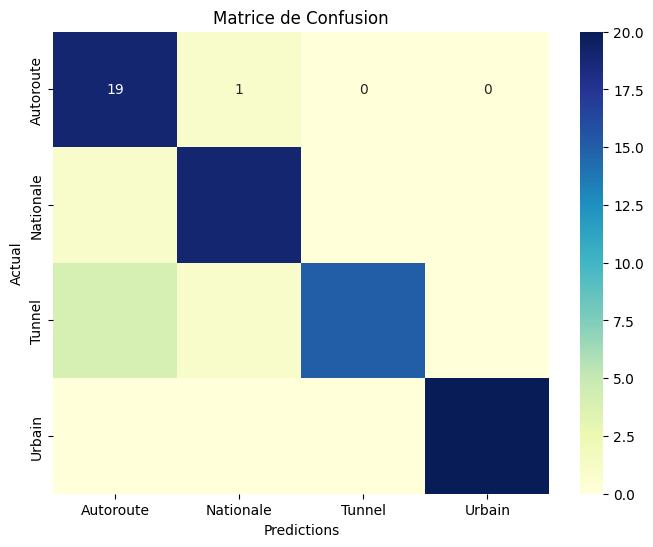

              precision    recall  f1-score   support

   Autoroute       0.79      0.95      0.86        20
   Nationale       0.90      0.95      0.93        20
      Tunnel       1.00      0.75      0.86        20
      Urbain       1.00      1.00      1.00        20

    accuracy                           0.91        80
   macro avg       0.92      0.91      0.91        80
weighted avg       0.92      0.91      0.91        80

Accuracy totale: 0.91


In [22]:
model = load_model('best_model_Updated.keras')

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    TEST_DATASET_PATH,
    target_size=(TARGET_WIDTH, TARGET_HEIGHT),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

predictions = model.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# Affichage de la matrice de confusion
conf_matrix = confusion_matrix(y_true, y_pred)
class_labels = list(test_generator.class_indices.keys())
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='YlGnBu', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predictions')
plt.ylabel('Actual')
plt.title('Matrice de Confusion')
plt.show()

# Rapport de classification
print(classification_report(y_true, y_pred, target_names=class_labels))

# Calcul de l'accuracy totale
overall_accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy totale: {overall_accuracy:.2f}")


## Visualisation de l'Entraînement


Pour visualiser les performances du modèle au fil des époques, nous traçons l'accuracy et la loss pour l'entraînement et la validation.



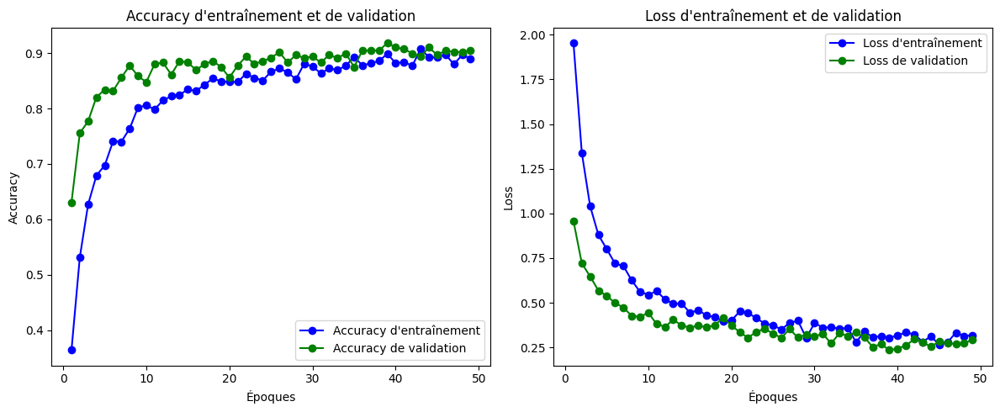

In [23]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'bo-', label="Accuracy d'entraînement")
plt.plot(epochs, val_acc, 'go-', label='Accuracy de validation')
plt.title("Accuracy d'entraînement et de validation")
plt.xlabel('Époques')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'bo-', label="Loss d'entraînement")
plt.plot(epochs, val_loss, 'go-', label='Loss de validation')
plt.title("Loss d'entraînement et de validation")
plt.xlabel('Époques')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


## Analyse Détaillée de la Performance du Modèle


Après avoir chargé le meilleur modèle et effectué des prédictions sur l'ensemble de test, nous allons calculer et visualiser plusieurs métriques clés pour évaluer la performance du modèle de manière exhaustive.

### Calcul de l'Accuracy Totale


L'accuracy totale nous donne une idée générale de la performance du modèle sur l'ensemble de test.


In [24]:
overall_accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy Totale: {overall_accuracy:.2f}")


Accuracy Totale: 0.91


### Rapport de Classification Détail


Le rapport de classification fournit une vue d'ensemble des performances du modèle pour chaque classe, incluant la précision (precision), le rappel (recall), et le score F1.



In [25]:
report = classification_report(y_true, y_pred, target_names=class_labels)
print("Rapport de Classification:\n", report)


Rapport de Classification:
               precision    recall  f1-score   support

   Autoroute       0.79      0.95      0.86        20
   Nationale       0.90      0.95      0.93        20
      Tunnel       1.00      0.75      0.86        20
      Urbain       1.00      1.00      1.00        20

    accuracy                           0.91        80
   macro avg       0.92      0.91      0.91        80
weighted avg       0.92      0.91      0.91        80



### Matrice de Confusion Normalisée


Une matrice de confusion normalisée peut aider à visualiser la performance du modèle en termes de précision des prédictions pour chaque classe, en mettant en évidence les éventuelles confusions entre classes.

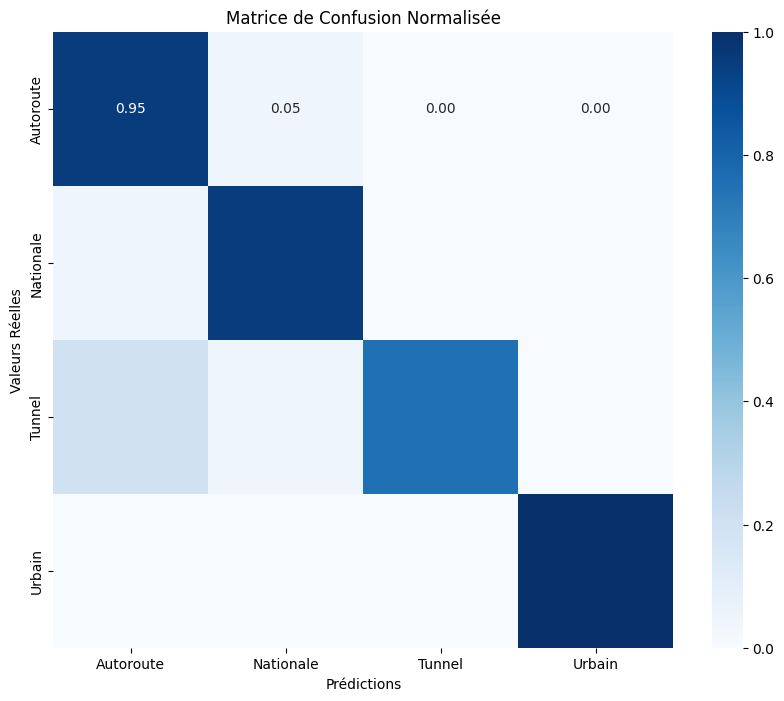

In [26]:
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Prédictions')
plt.ylabel('Valeurs Réelles')
plt.title('Matrice de Confusion Normalisée')
plt.show()


### Calcul et Affichage des Métriques Micro et Macro


Les métriques micro et macro offrent une perspective plus riche sur la performance du modèle, surtout dans les cas de déséquilibre de classe.

In [27]:
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_macro = precision_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_macro = recall_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_macro = f1_score(y_true, y_pred, average='macro')

print(f"Précision Micro: {precision_micro:.2f}")
print(f"Précision Macro: {precision_macro:.2f}")
print(f"Rappel Micro: {recall_micro:.2f}")
print(f"Rappel Macro: {recall_macro:.2f}")
print(f"Score F1 Micro: {f1_micro:.2f}")
print(f"Score F1 Macro: {f1_macro:.2f}")


Précision Micro: 0.91
Précision Macro: 0.92
Rappel Micro: 0.91
Rappel Macro: 0.91
Score F1 Micro: 0.91
Score F1 Macro: 0.91


## Affichage des images avec prédictions et vraies étiquettes

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


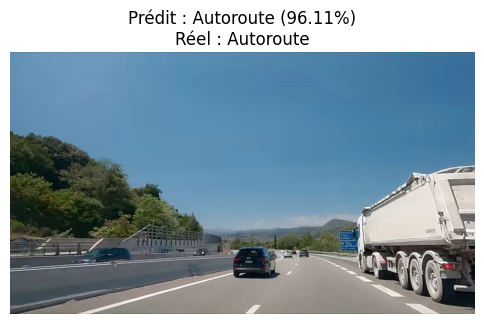

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


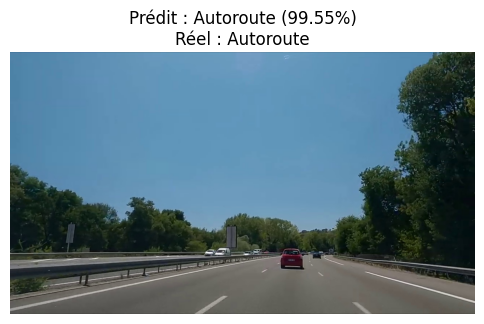

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


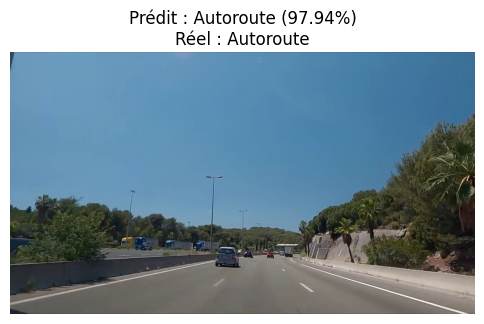

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


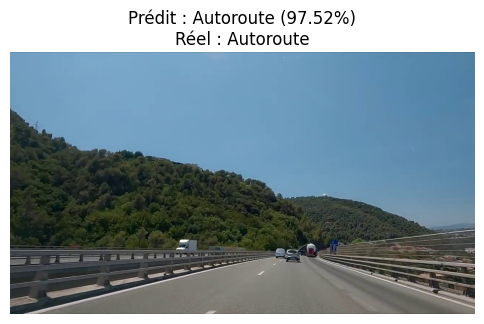

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


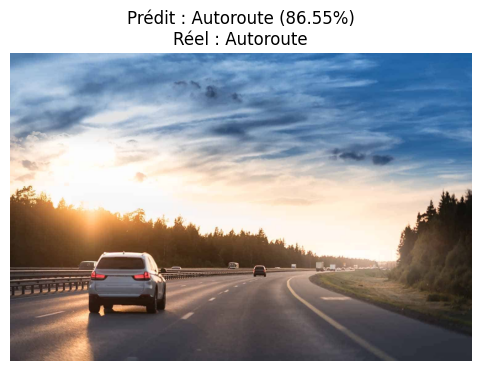

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


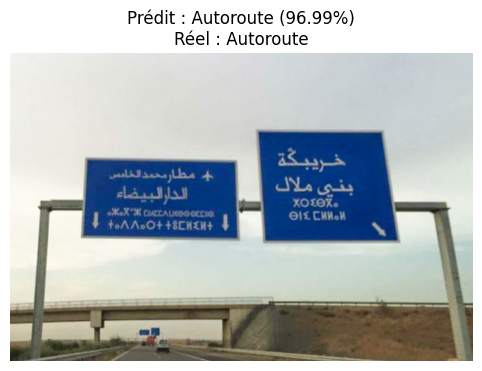

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


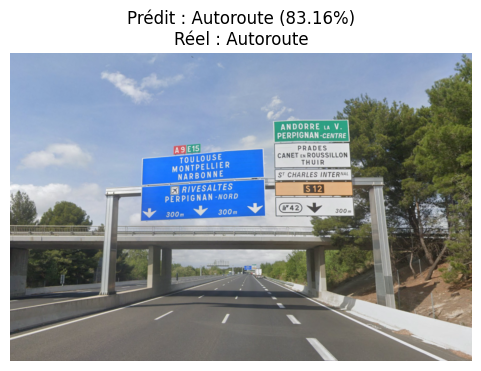

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


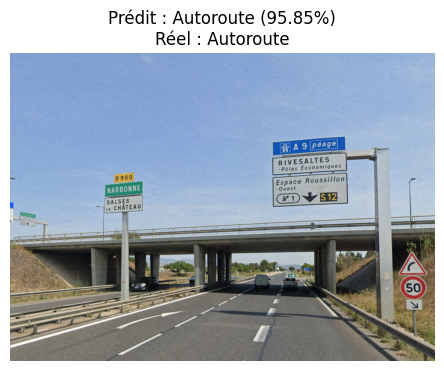

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


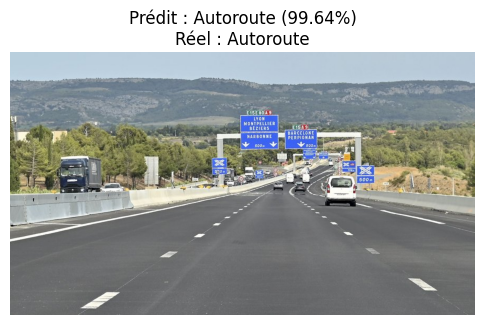

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


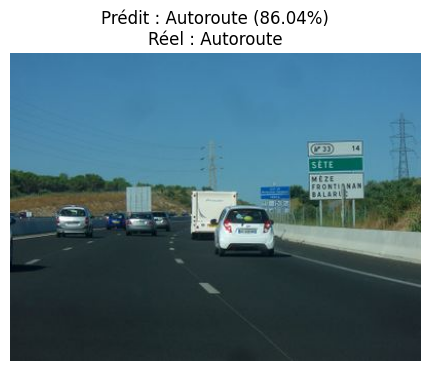

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


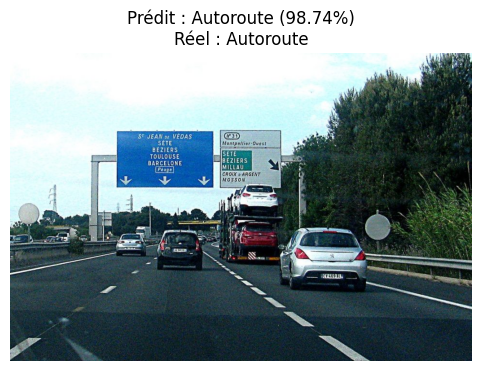

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


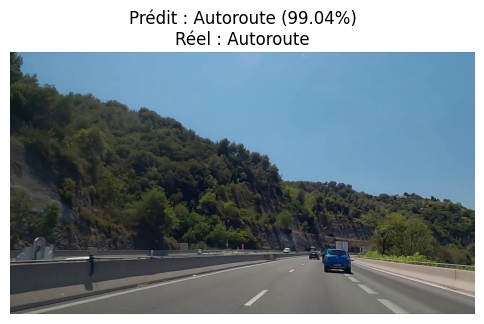

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


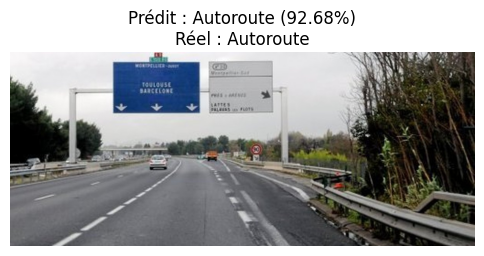

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


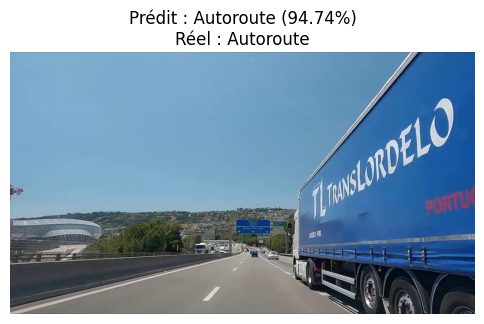

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


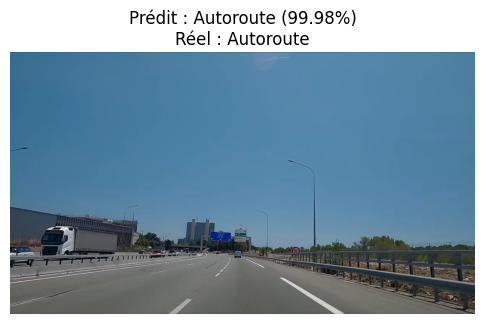

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


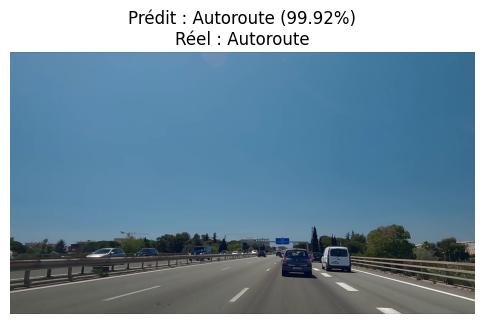

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


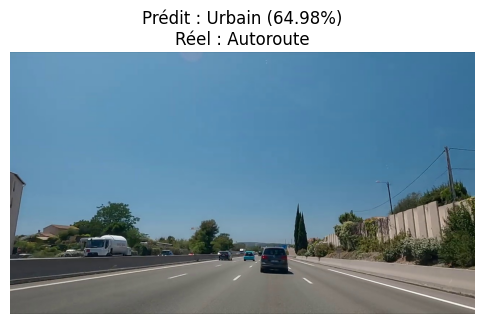

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


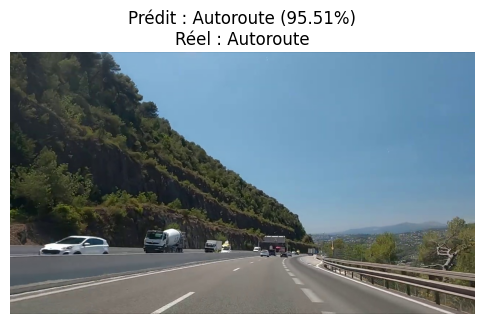

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


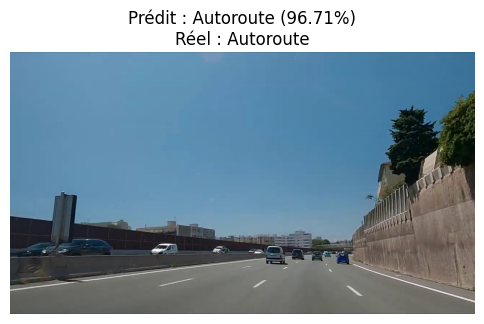

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


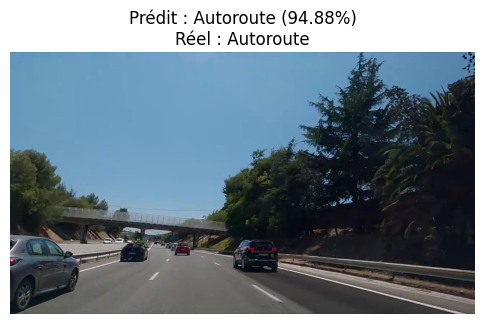

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


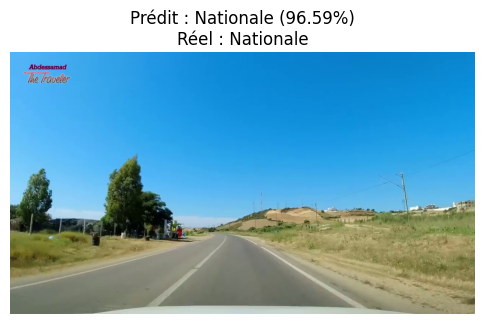

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


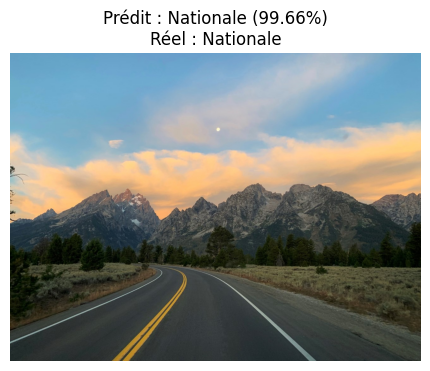

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


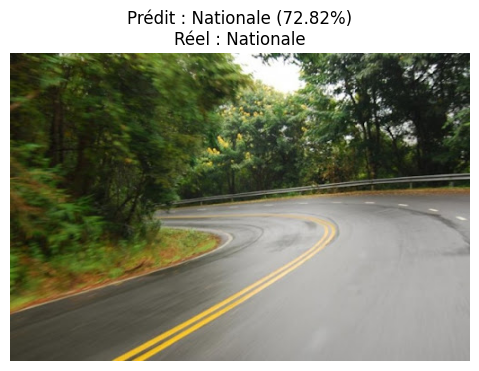

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


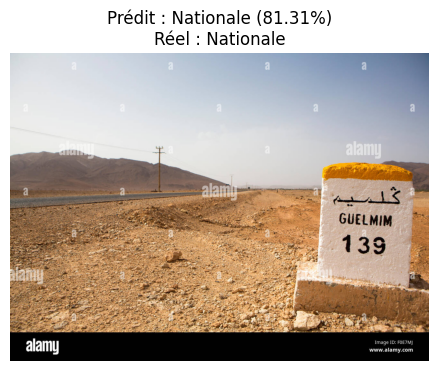

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


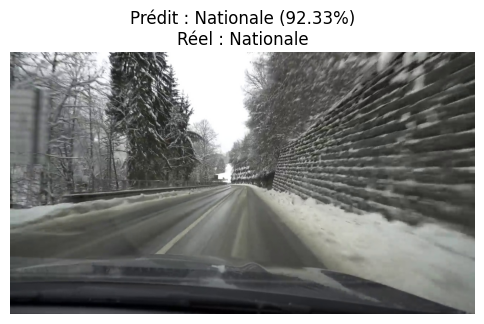

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


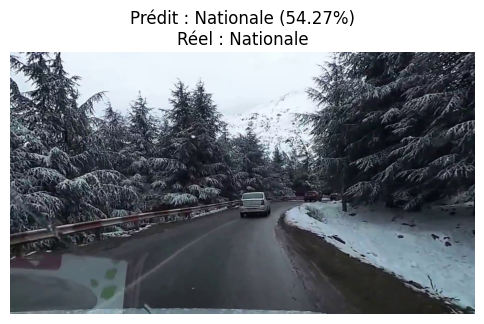

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


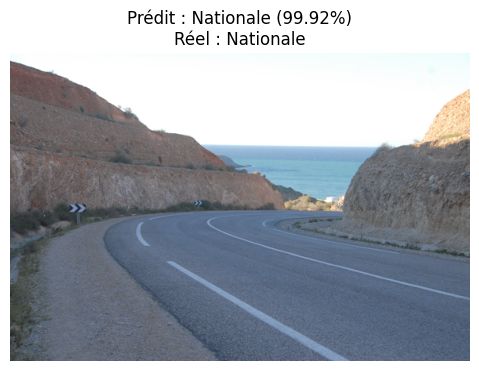

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


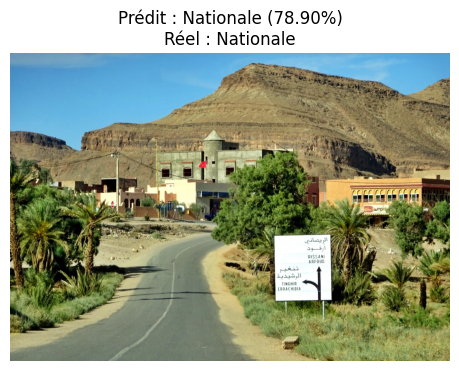

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


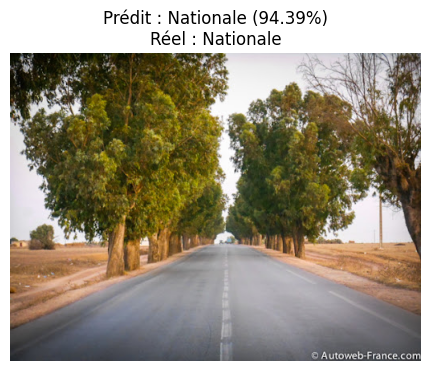

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


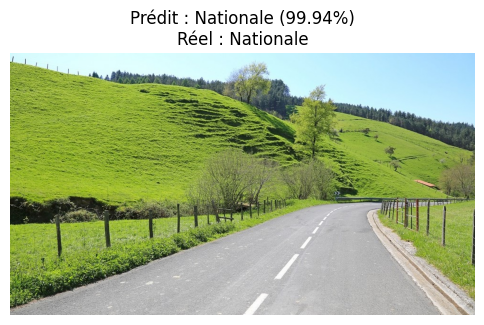

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


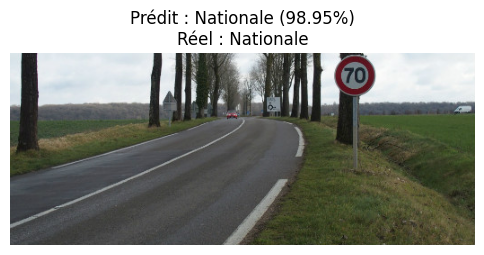

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


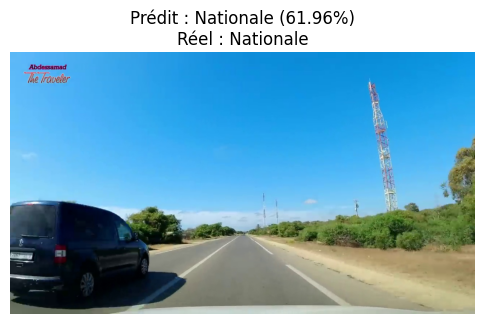

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


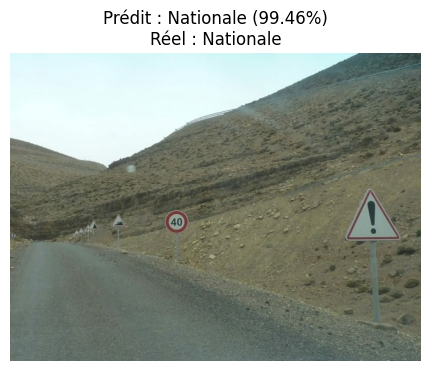

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


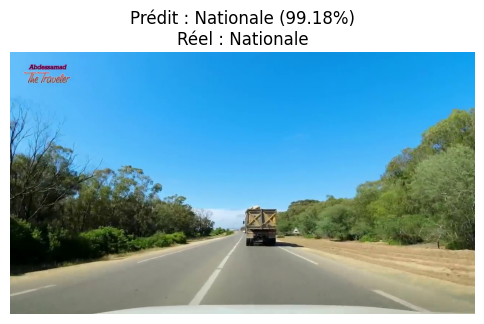

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


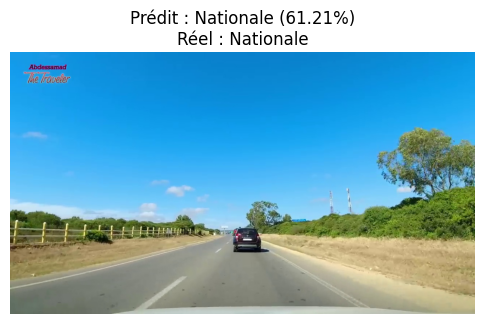

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


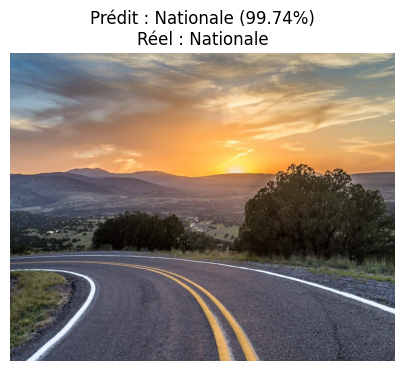

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


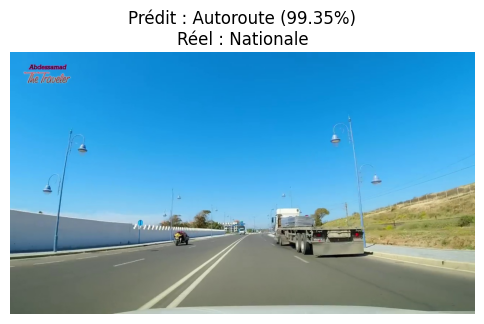

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


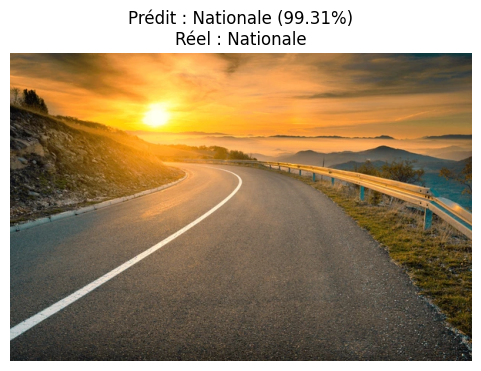

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


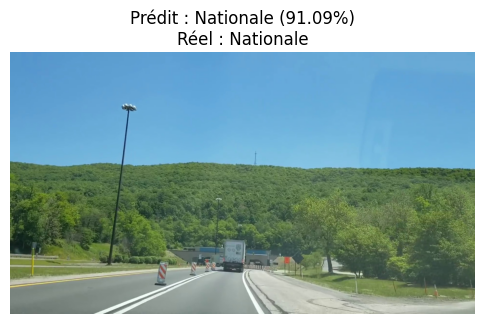

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


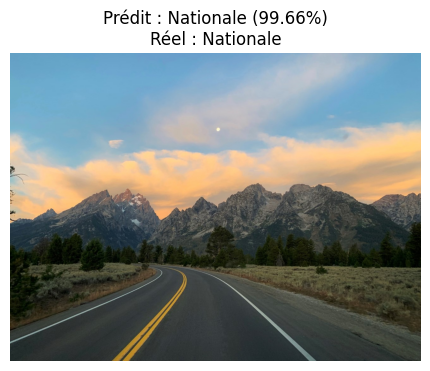

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


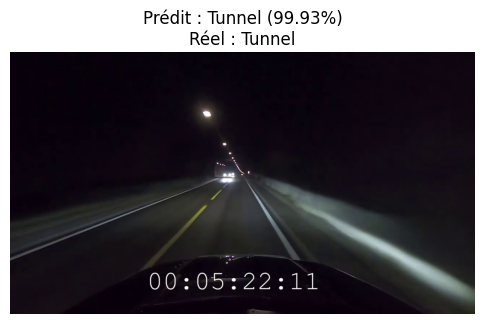

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


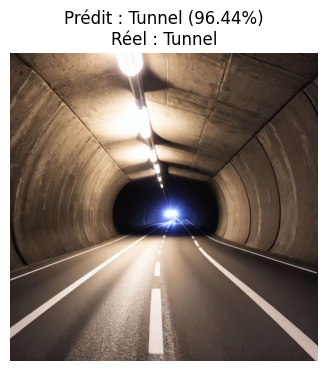

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


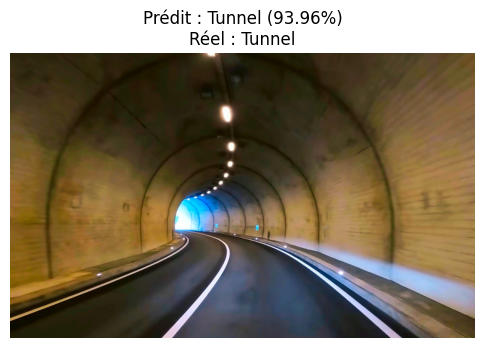

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


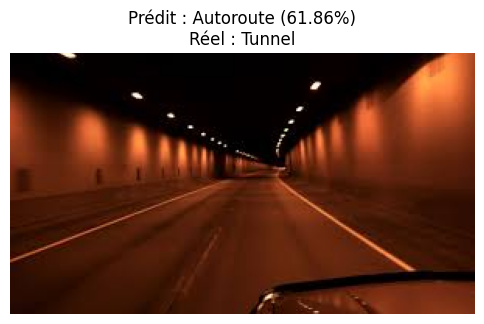

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


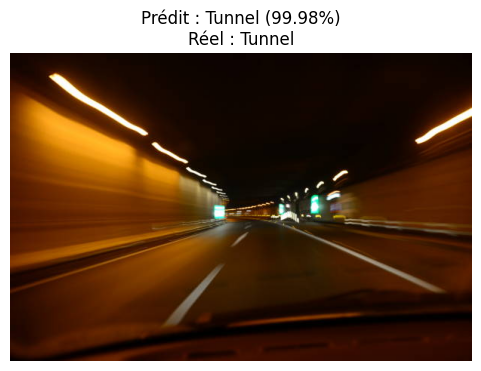

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


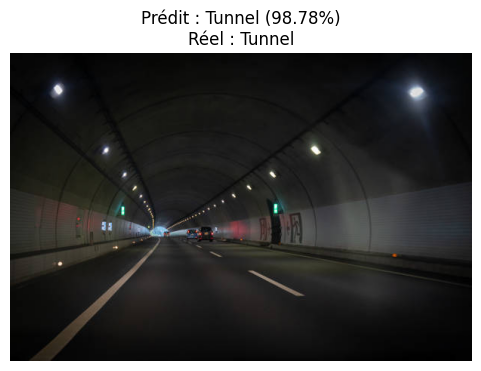

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


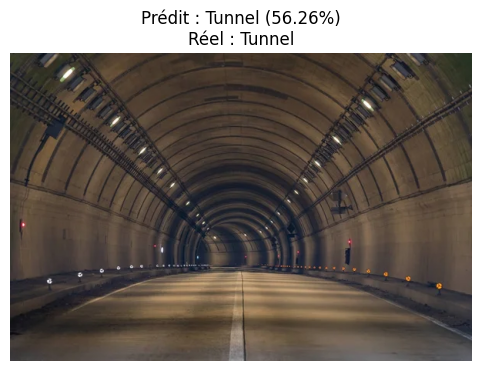

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


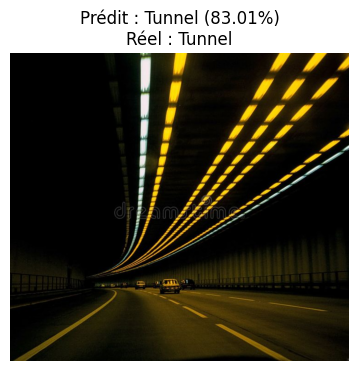

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


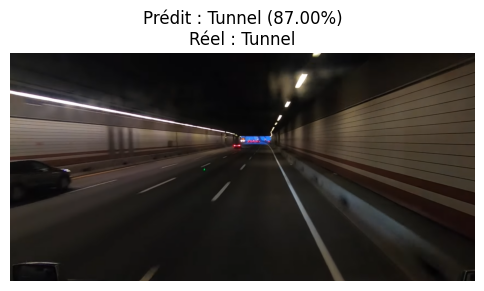

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


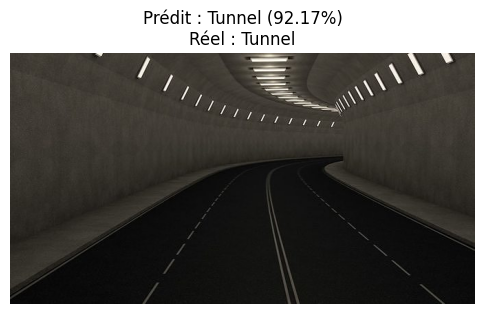

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


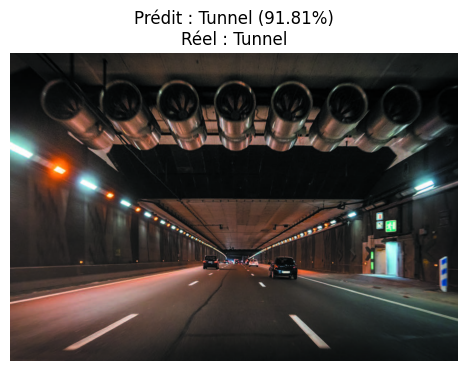

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


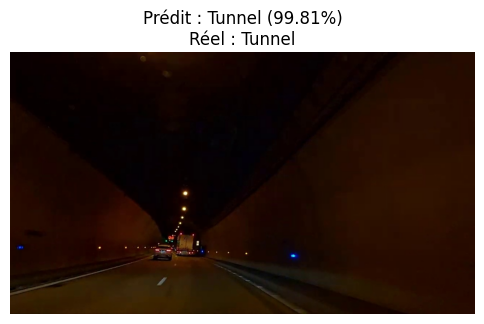

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


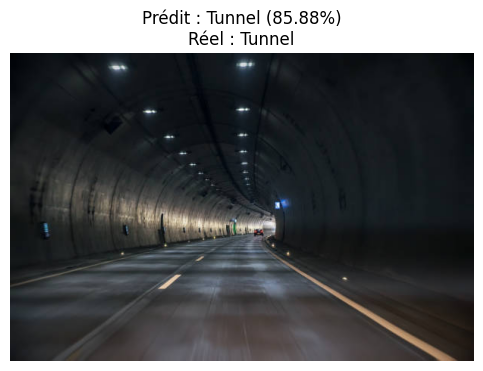

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


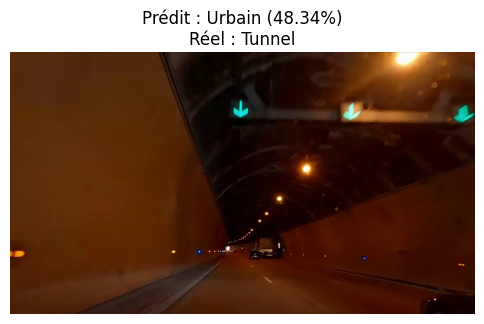

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


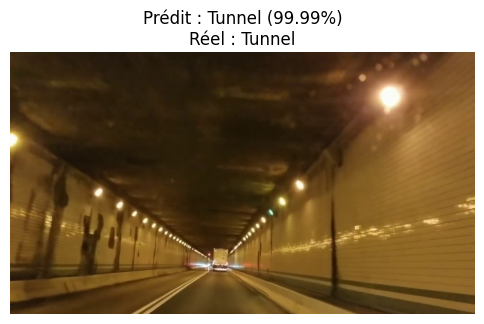

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


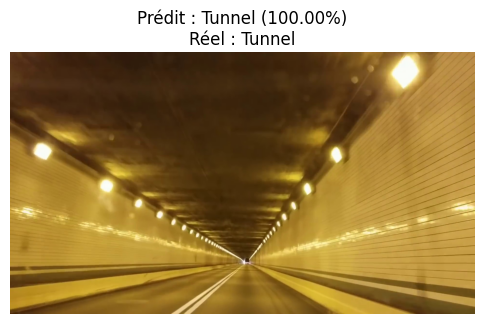

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


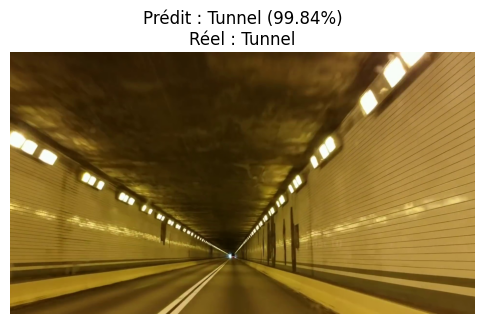

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


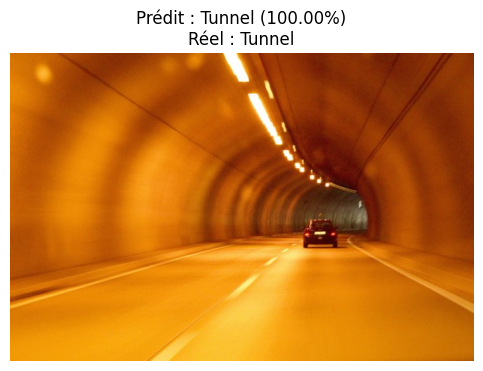

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


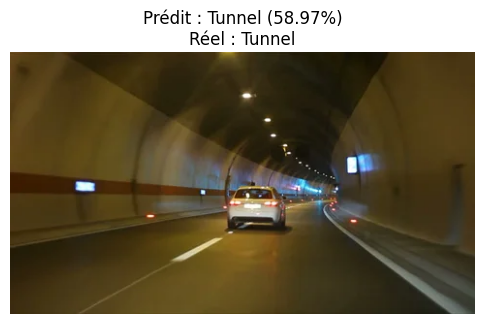

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


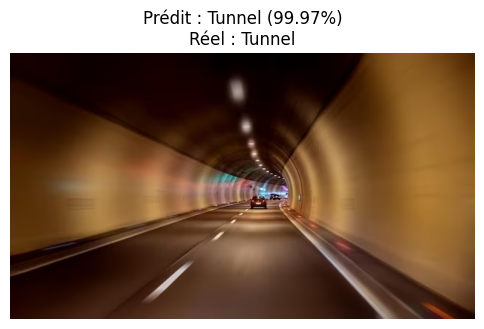

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


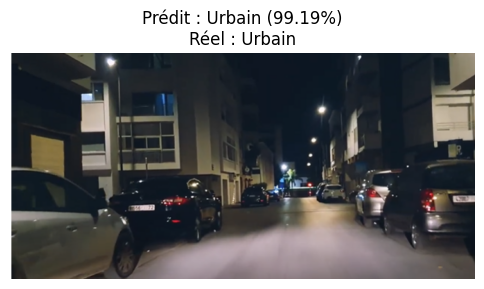

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


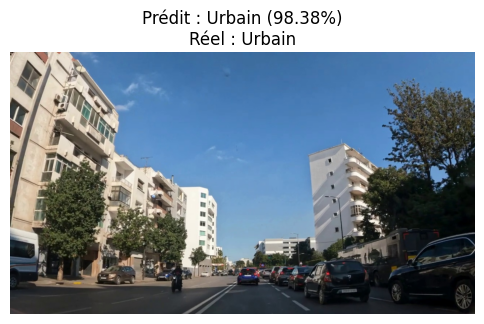

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


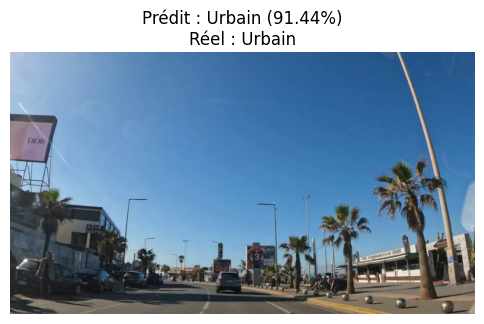

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


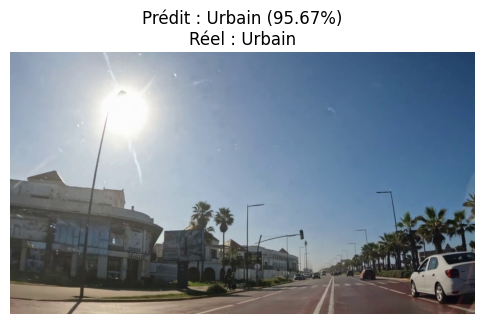

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


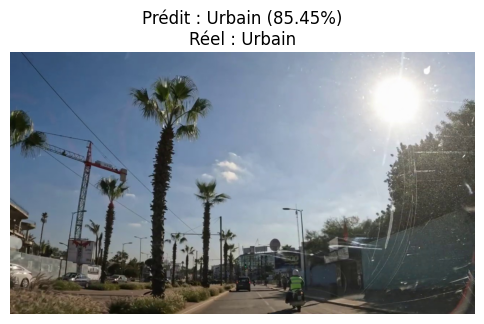

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


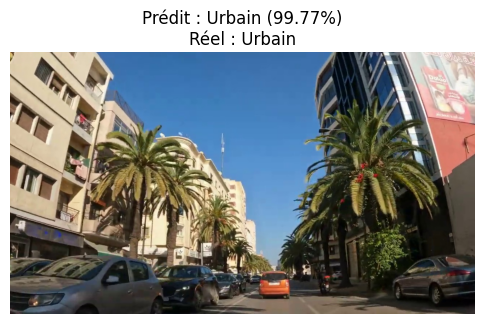

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


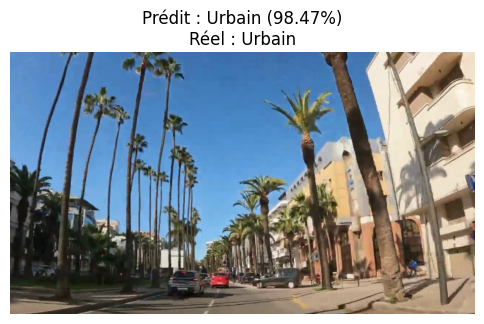

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


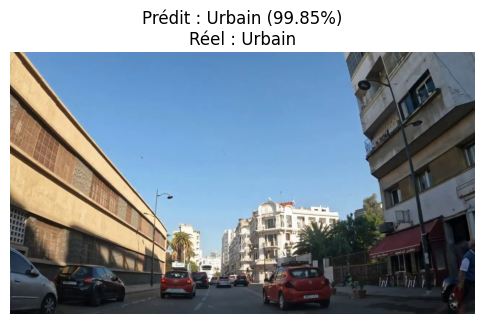

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


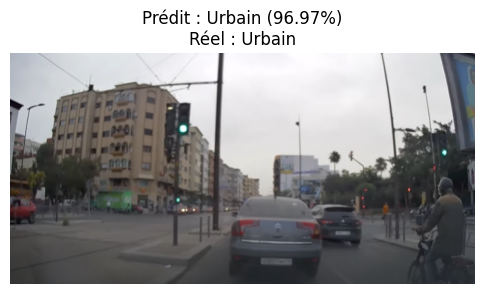

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


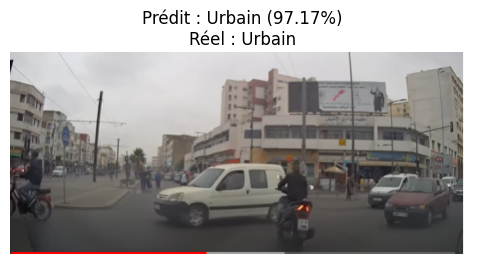

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


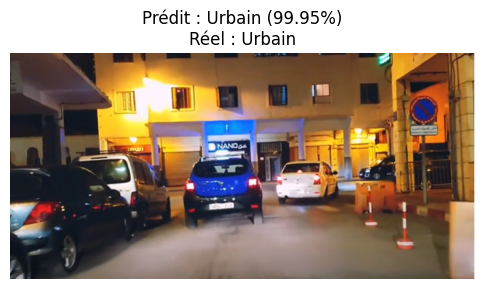

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


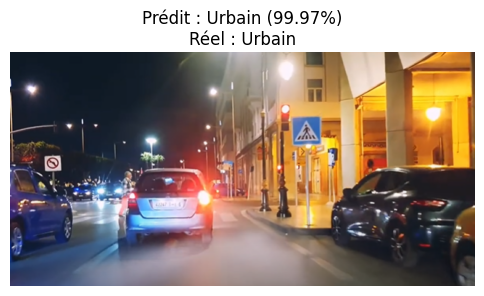

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


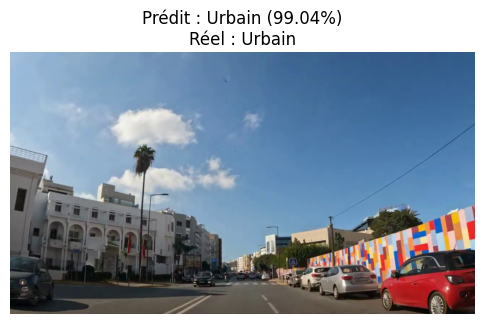

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


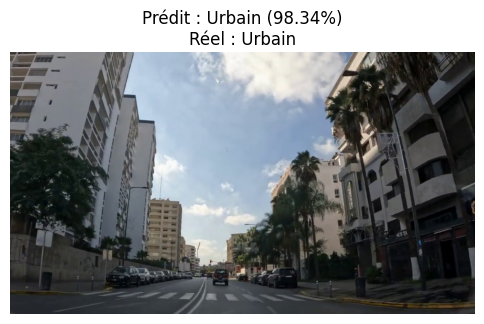

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


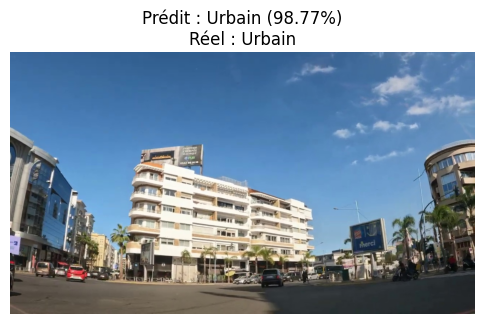

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


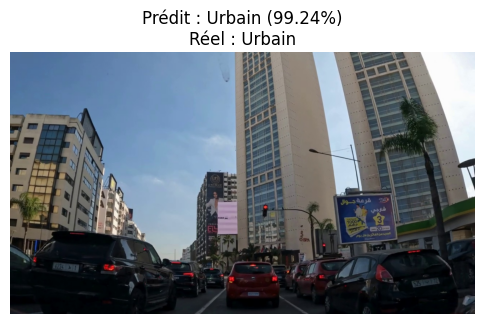

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


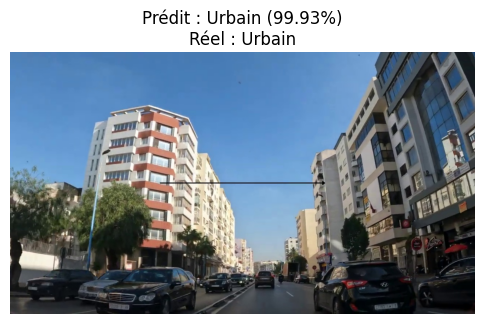

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


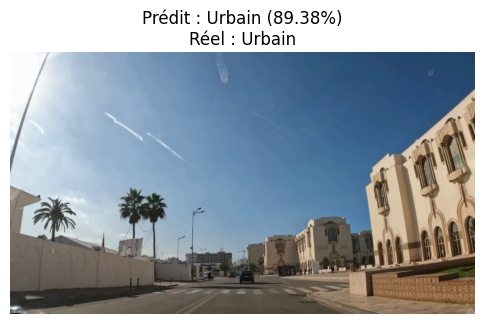

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


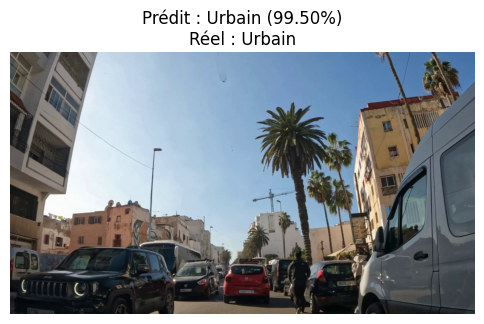

In [28]:

# Import nécessaire pour 'image.load_img' si pas déjà fait
from tensorflow.keras.preprocessing import image

# Assurez-vous que la fonction est définie comme ci-dessous pour un usage individuel d'images
def load_and_prepare_image(file_path, target_size=(224, 224)):
    img = image.load_img(file_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array_expanded_dims = np.expand_dims(img_array, axis=0)
    return preprocess_input(img_array_expanded_dims)

# Affichage des images avec prédictions et vraies étiquettes pour un échantillon
for i, path in enumerate(test_generator.filepaths[:79]):  # Modifier selon le nombre voulu d'images à afficher
    img_prepared = load_and_prepare_image(path)
    prediction = model.predict(img_prepared)
    predicted_class_index = np.argmax(prediction)
    predicted_class = list(train_generator.class_indices.keys())[predicted_class_index]
    true_class_index = y_true[i]
    true_class = list(train_generator.class_indices.keys())[true_class_index]
    confidence = np.max(prediction) * 100  # Confiance de la prédiction

    # Affichage de l'image et de ses prédictions
    plt.figure(figsize=(6, 4))
    plt.imshow(image.load_img(path))
    plt.title(f'Prédit : {predicted_class} ({confidence:.2f}%)\nRéel : {true_class}')
    plt.axis('off')
    plt.show()


## Conclusion

Ce notebook a guidé à travers les étapes de construction, d'entraînement, et d'évaluation d'un modèle de classification d'images en utilisant TensorFlow et MobileNetV2. Nous avons visualisé les performances du modèle et utilisé différentes métriques pour évaluer sa capacité à classifier correctement les types de routes à partir des images.

In [34]:
import os

# Fonctions définies précédemment
def charger_modele(chemin_modele='best_model_Updated.keras'):
    from tensorflow.keras.models import load_model
    return load_model(chemin_modele)

def preparer_image(image_path, target_size=(224, 224)):
    from tensorflow.keras.preprocessing.image import img_to_array, load_img
    from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
    image = load_img(image_path, target_size=target_size)
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    return image

def predire_image(modele, image):
    predictions = modele.predict(image)
    classe_predite = np.argmax(predictions, axis=1)
    return classe_predite

# Chargement du modèle
modele = charger_modele('best_model.keras')

# Dictionnaire pour mapper les indices de classe aux noms réels
classes = {0: 'autoroute', 1: 'nationale', 2: 'tunnel', 3: 'urbain'}

# Chemin vers le dossier contenant les sous-dossiers de catégories
chemin_dossier = r'C:\Users\aben-taher-ext\Documents\GitHub\PFE\Road_Classification\testData'

# Parcourir chaque sous-dossier et chaque image
for dossier in os.listdir(chemin_dossier):
    chemin_sous_dossier = os.path.join(chemin_dossier, dossier)
    if os.path.isdir(chemin_sous_dossier):
        print(f"Prédictions pour le dossier: {dossier}")
        for fichier in os.listdir(chemin_sous_dossier):
            chemin_fichier = os.path.join(chemin_sous_dossier, fichier)
            if os.path.isfile(chemin_fichier) and fichier.lower().endswith(('.png', '.jpg', '.jpeg')):
                # Préparer l'image et prédire la classe
                image = preparer_image(chemin_fichier)
                classe_predite = predire_image(modele, image)
                nom_classe_predite = classes[classe_predite[0]]
                print(f"{fichier}: {nom_classe_predite}")


Prédictions pour le dossier: Autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
autoroute1.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
autoroute10.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
autoroute11.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
autoroute12.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
autoroute13.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
autoroute14.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
autoroute15.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
autoroute16.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
autoroute17.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
autoroute18.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
autoroute19.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
autoroute2.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
autoroute20.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
autoroute3.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
autoroute4.jpg: au

In [36]:
import os
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import glob

# Fonctions définies précédemment
def charger_modele(chemin_modele='best_model_Updated.keras'):
    from tensorflow.keras.models import load_model
    return load_model(chemin_modele)

def preparer_image(image_path, target_size=(224, 224)):
    from tensorflow.keras.preprocessing.image import img_to_array, load_img
    from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
    image = load_img(image_path, target_size=target_size)
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    return image

def predire_image(modele, image):
    predictions = modele.predict(image)
    classe_predite = np.argmax(predictions, axis=1)
    return classe_predite

# Chargement du modèle
modele = charger_modele('best_model_Updated.keras')

# Dictionnaire pour mapper les indices de classe aux noms réels
classes = {0: 'autoroute', 1: 'nationale', 2: 'tunnel', 3: 'urbain'}

# Chemin vers le dossier contenant les sous-dossiers de catégories
chemin_dossier = r'C:\Users\aben-taher-ext\Documents\GitHub\PFE\Road_Classification\testData'

# Parcourir chaque sous-dossier et chaque image
for dossier in os.listdir(chemin_dossier):
    chemin_sous_dossier = os.path.join(chemin_dossier, dossier)
    if os.path.isdir(chemin_sous_dossier):
        print(f"Prédictions pour le dossier: {dossier}")
        for fichier in os.listdir(chemin_sous_dossier):
            chemin_fichier = os.path.join(chemin_sous_dossier, fichier)
            if os.path.isfile(chemin_fichier) and fichier.lower().endswith(('.png', '.jpg', '.jpeg')):
                # Préparer l'image et prédire la classe
                image = preparer_image(chemin_fichier)
                classe_predite = predire_image(modele, image)
                nom_classe_predite = classes[classe_predite[0]]
                print(f"{fichier}: {nom_classe_predite}")


Prédictions pour le dossier: Autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
autoroute1.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
autoroute10.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
autoroute11.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
autoroute12.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
autoroute13.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
autoroute14.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
autoroute15.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
autoroute16.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
autoroute17.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
autoroute18.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
autoroute19.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
autoroute2.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
autoroute20.png: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
autoroute3.jpg: autoroute
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
autoroute4.jpg: au

In [37]:
base_model.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

## Unit Test Interface Graphique

In [25]:
pip install --upgrade gradio

Note: you may need to restart the kernel to use updated packages.


In [42]:
import numpy as np
import PIL
from skimage.transform import resize
import gradio as gr
from keras.models import load_model
import os
 
# Settings
MODEL_PATH = r'C:\Users\aben-taher-ext\Documents\GitHub\PFE\Road_Classification\best_model_Updated.keras'
TARGET_WIDTH = 224
TARGET_HEIGHT = 224
LABELS = ["Autoroute", "Nationale" , "Tunnel" , "Urbain"]
TEST_DATASET_PATH = r'C:\Users\aben-taher-ext\Documents\GitHub\PFE\Road_Classification\testData'
 
# Load the trained model
model = load_model(MODEL_PATH)
 
# Preprocess the image to match the input shape the model expects
def preprocess_image(image):
    img_array = np.asarray(image)
    # Resize the image to the target size
    img_array = resize(img_array, (TARGET_WIDTH, TARGET_HEIGHT), anti_aliasing=True)
    # Expand dimensions to add the batch size
    img_array = np.expand_dims(img_array, axis=0)
    return img_array
 
# Make predictions
def predict(image):
    try:
        img_array = preprocess_image(image)
        prediction = model.predict(img_array)
        predicted_label_index = np.argmax(prediction[0])
        predicted_label = LABELS[predicted_label_index]
        return predicted_label
    except Exception as e:
        return str(e)
 
# Interface
iface = gr.Interface(predict, 
                     inputs=gr.components.Image(width=TARGET_WIDTH, height=TARGET_HEIGHT),
                     outputs="text", 
                     title="Road Classification",
                     description="Upload an image to predict the type of road.")
iface.launch()


Running on local URL:  http://127.0.0.1:7870

To create a public link, set `share=True` in `launch()`.


C:\Users\aben-taher-ext\AppData\Local\anaconda3\Lib\site-packages\gradio\analytics.py:98: UserWarning: unable to parse version details from package URL.
  warnings.warn("unable to parse version details from package URL.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
